In [1]:
import pandas as pd
import os
import pickle

In [42]:
# xls = pd.ExcelFile("../Мероприятия/Events.xlsx")
# df_ex_2 = pd.DataFrame()
# for sheet in xls.sheet_names:
#     print(sheet)
#     df = pd.read_excel(xls, sheet)
#     print('parsed')
#     df_ex_2 = df_ex_2.append(df)
#     print('next')
# df_ex_2.to_csv("Мероприятия.csv")

ЭНБ Москвы
parsed
next


# Мероприятия

In [2]:
# # parallel map

# def parallelize_dataframe(df, func, n_cores=4):
#     df_split = np.array_split(df, n_cores)
#     pool = Pool(n_cores)
#     df = pd.concat(pool.map(func, df_split))
#     pool.close()
#     pool.join()
#     return df

In [2]:
path = "../final_data/Мероприятия.csv"         

In [3]:
pd.read_csv(path, nrows=4)

,Unnamed: 0,id,Название мероприятия,Статус,Наименование учреждения,Тип учреждения,Подразделение,Стоимость (полная),Тип мероприятия,Направленность мероприятия,...,Краткое описание,Проводится онлайн,Место проведения,Округ,Район,Доступность мероприятия для лиц с ОВЗ,Тип ОВЗ,Возрастной ценз участников мероприятия,Возрастная категория,Целевая аудитория
0,0,5,Фестивлаь современных молодежных уличных культ...,Завершено,ГБУК г. Москвы «Клуб «Современник»,Дома культуры,NaN,бесплатное,фестиваль,культурно-досуговое,...,Клуб Современник проведет фестиваль современны...,Нет,NaN,NaN,NaN,недоступно,NaN,0+,от 20 до 40,NaN
1,1,12,"Танцевальный вечер ""Ретро"" в честь Дня Победы ...",Завершено,ГБУК г.Москвы «ДК «Нагорный»,Дома культуры,NaN,бесплатное,"танцевальный вечер, бал",патриотическое,...,"Танцевальный вечер ""Ретро"" в честь Дня Победы",Нет,"Электролитный пр. 3, корпус 1",Южный административный округ,Нагорный,недоступно,NaN,16+,от 40 до 85,"работающая молодежь, взрослые, пенсионеры"
2,2,3179,Врасплох,Завершено,ГБУК г. Москвы «ДК «Нагатино»,Дома культуры,NaN,бесплатное,выставка,антитеррор,...,Регулярное (ежеквартальное) мероприятие цикла ...,Нет,"Судостроительная ул. 31, корпус 1",Южный административный округ,Нагатинский Затон,NaN,NaN,6+,от 16 до 100,"школьники, работающая молодежь, студенческая м..."
3,3,486,Праздник Новогодней елки. Новогодний концерт в...,Завершено,ГАУК г. Москвы «Культурный центр ЗИЛ»,Дома культуры,NaN,бесплатное,"концерт, музыкальное представление",культурно-досуговое,...,Коллектив Культурного центра ЗИЛ Ансамбль эстр...,Нет,"Россия, Москва",NaN,NaN,NaN,NaN,0+,от 5 до 14,"дети дошкольного возраста, школьники"


### Тип мероприятия

In [4]:
import collections

In [6]:
event_type = pd.read_csv(path, usecols=["Тип мероприятия"])

In [7]:
def bar_plot_events(event_type, target, legend=None):
    print("Мы имеем ", len(set(event_type[target].dropna())), " различных представителей")
    count = collections.Counter(event_type.values.ravel())
    ax = (
        pd.DataFrame(sorted(count.items(), key=lambda pair: pair[1], reverse=True))
        .dropna()
        .set_index(0)
        .plot(kind="bar", figsize=(15, 6))
    )
    if legend:
        ax.legend([legend])

Мы имеем  35  различных представителей


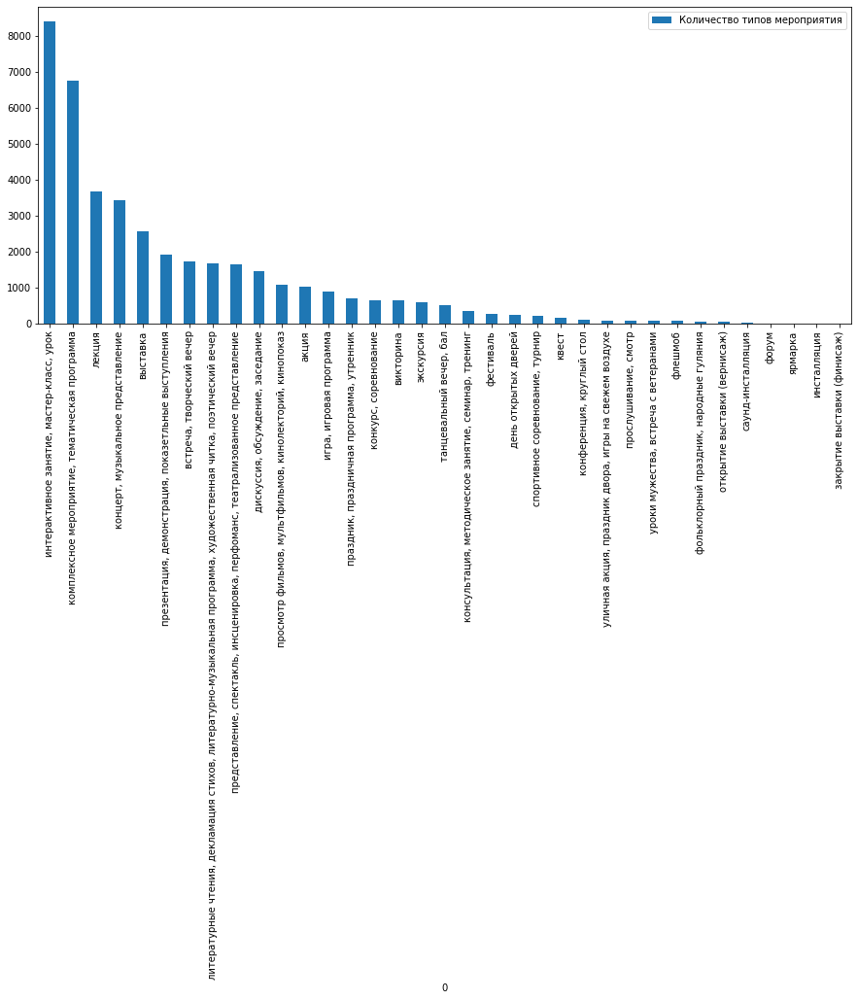

In [102]:
bar_plot_events(event_type, target="Тип мероприятия", legend="Количество типов мероприятия")

### Направленность мероприятия

Мы имеем  72  различных представителей


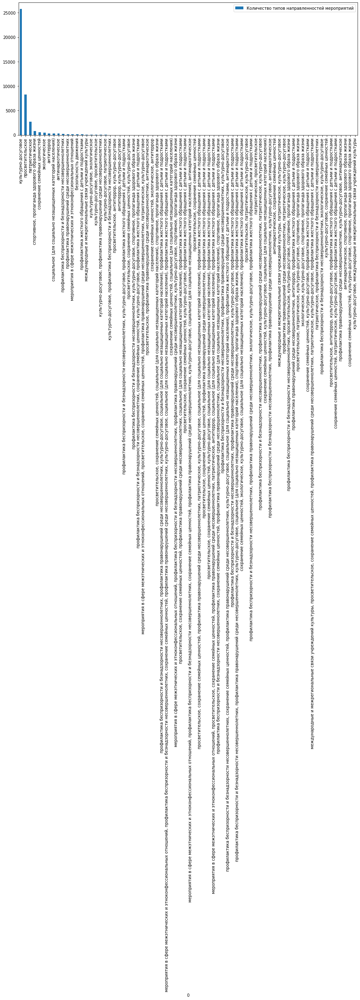

In [9]:
bar_plot_events(
    pd.read_csv(path, usecols=["Направленность мероприятия"]),
    target="Направленность мероприятия",
    legend="Количество типов направленностей мероприятий",
)

### Округ

Мы имеем  12  различных представителей


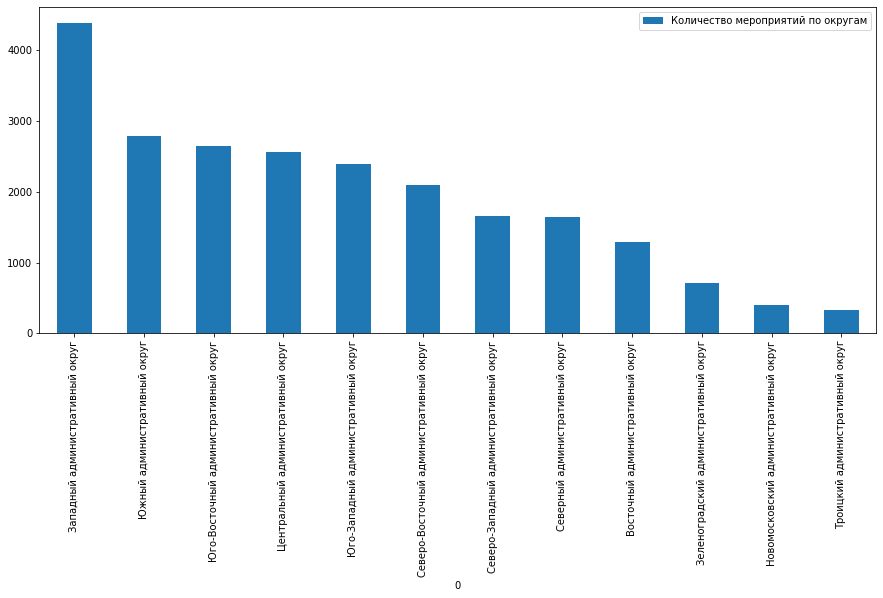

In [10]:
bar_plot_events(
    pd.read_csv(path, usecols=["Округ"]),
    target="Округ",
    legend="Количество мероприятий по округам",
)

### Район

Мы имеем  139  различных представителей


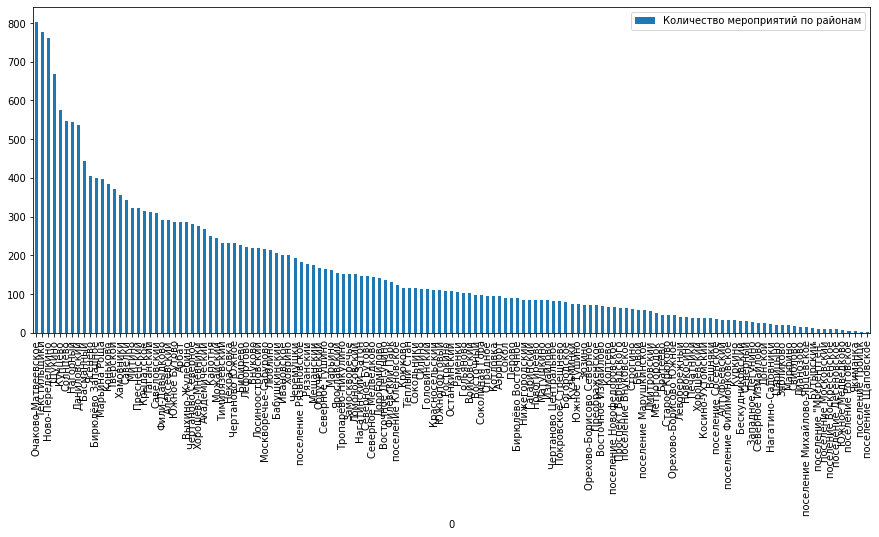

In [11]:
bar_plot_events(
    pd.read_csv(path, usecols=["Район"]),
    target="Район",
    legend="Количество мероприятий по районам",
)

### Возрастной ценз участников мероприятия

Мы имеем  5  различных представителей


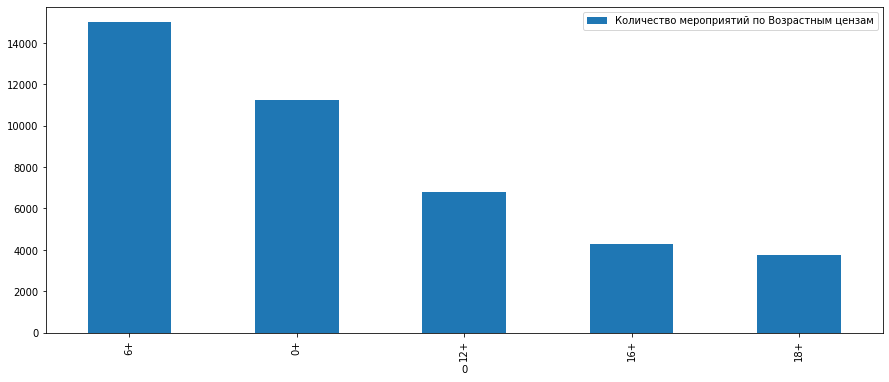

In [12]:
bar_plot_events(
    pd.read_csv(path, usecols=["Возрастной ценз участников мероприятия"]),
    target="Возрастной ценз участников мероприятия",
    legend="Количество мероприятий по Возрастным цензам",
)

Мы имеем  669  различных представителей


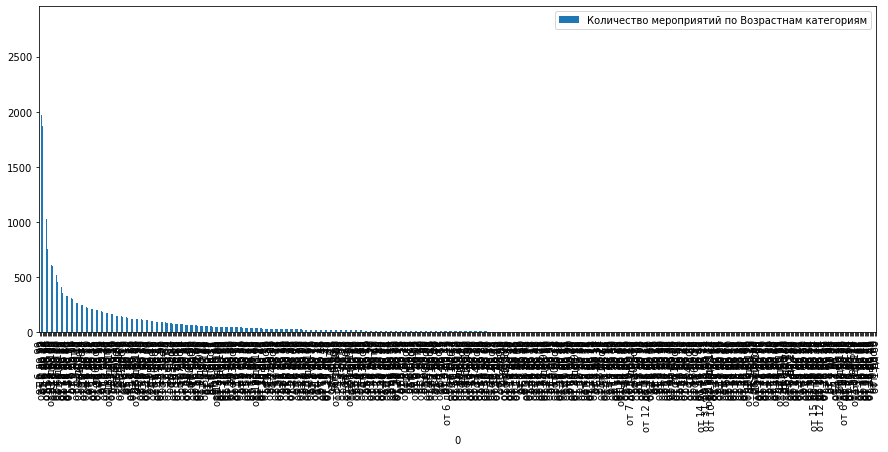

In [13]:
bar_plot_events(
    pd.read_csv(path, usecols=["Возрастная категория"]),
    target="Возрастная категория",
    legend="Количество мероприятий по Возрастнам категориям",
)

In [14]:
age = pd.read_csv(path, usecols=["Возрастная категория", "Возрастной ценз участников мероприятия"])
age["low"] = age["Возрастная категория"].apply(lambda x: x.split()[1])
age["high"] = age["Возрастная категория"].apply(lambda x: x.split()[3] if len(x.split()) == 4 else "no_limits")
age[age["high"] == "no_limits"]

,Возрастной ценз участников мероприятия,Возрастная категория,low,high
68,0+,от 680,680,no_limits
165,0+,от 3,3,no_limits
186,6+,от 10,10,no_limits
471,6+,от 6 до 12 до 16,6,no_limits
473,18+,от 18,18,no_limits
...,...,...,...,...
40934,0+,от 4,4,no_limits
40935,0+,от 4,4,no_limits
40938,0+,от 5,5,no_limits
40949,0+,от 5,5,no_limits


Так как Возрастной ценз участников мероприятия сопряжен с Возрастной категорией, то мы исключим Возрастные категории из рассмотрения

### Целевая аудитория

In [31]:
pd.read_csv(path, usecols=["Целевая аудитория"]).dropna().head()

,Целевая аудитория
1,"работающая молодежь, взрослые, пенсионеры"
2,"школьники, работающая молодежь, студенческая м..."
3,"дети дошкольного возраста, школьники"
4,"дети дошкольного возраста, школьники, работающ..."
5,"дети дошкольного возраста, школьники"


In [116]:
people_cat = pd.read_csv(path, usecols=["Целевая аудитория"]).dropna().values.ravel()

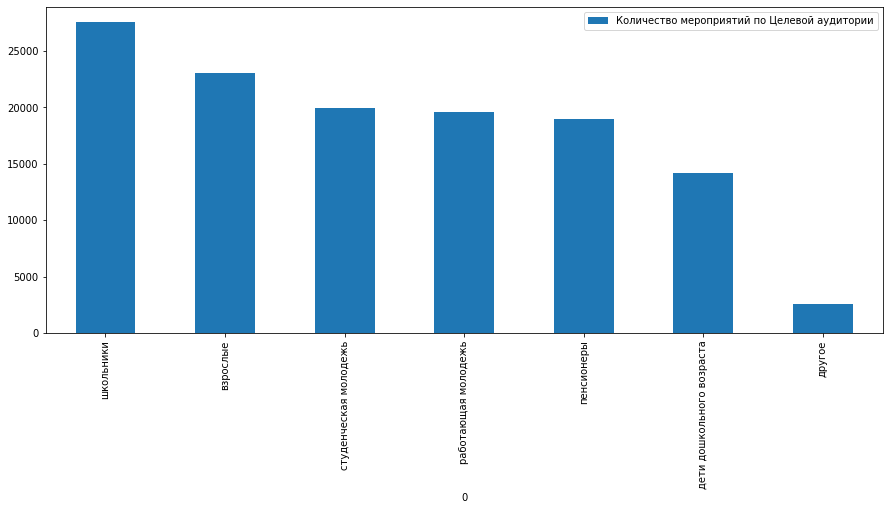

In [117]:
count = collections.Counter([word.strip() for word in ",".join(people_cat).split(",")])
ax = (
        pd.DataFrame(sorted(count.items(), key=lambda pair: pair[1], reverse=True))
        .dropna()
        .set_index(0)
        .plot(kind="bar", figsize=(15, 6))
    )
ax.legend(["Количество мероприятий по Целевой аудитории"])

In [5]:
def parallelize_dataframe(df, func, n_cores=4):
    df_split = np.array_split(df, n_cores)
    pool = Pool(n_cores)
    df = pd.concat(pool.map(func, df_split))
    pool.close()
    pool.join()
    return df

In [6]:
# # Мы заменяем "других" на все типы
# common_target_group = ", ".join(count.keys()).replace(", другое", "")

# events.loc[events["Целевая аудитория"] == "другое", "Целевая аудитория"] = common_target_group

In [7]:
d = {1: 'yes', 0: 'no'}
people_cat2 = pd.read_csv(path, usecols=["Целевая аудитория"])
res = people_cat2.join(people_cat2.pop('Целевая аудитория').str.get_dummies(', '))

In [8]:
res

,взрослые,дети дошкольного возраста,другое,пенсионеры,работающая молодежь,студенческая молодежь,школьники
0,0,0,0,0,0,0,0
1,1,0,0,1,1,0,0
2,1,0,0,1,1,1,1
3,0,1,0,0,0,0,1
4,1,1,0,1,1,1,1
...,...,...,...,...,...,...,...
41069,0,1,0,0,0,0,1
41070,0,1,0,0,0,0,1
41071,1,1,0,0,1,1,1
41072,0,1,0,0,0,0,1


### Наиболее похожие по описанию мероприятия

In [9]:
from sklearn.feature_extraction.text import TfidfVectorizer

import string

from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("russian")

In [10]:
russian_stop_words = {
    "words": [
        "а",
        "е",
        "и",
        "ж",
        "м",
        "о",
        "на",
        "не",
        "ни",
        "об",
        "но",
        "он",
        "мне",
        "мои",
        "мож",
        "она",
        "они",
        "оно",
        "мной",
        "много",
        "многочисленное",
        "многочисленная",
        "многочисленные",
        "многочисленный",
        "мною",
        "мой",
        "мог",
        "могут",
        "можно",
        "может",
        "можхо",
        "мор",
        "моя",
        "моё",
        "мочь",
        "над",
        "нее",
        "оба",
        "нам",
        "нем",
        "нами",
        "ними",
        "мимо",
        "немного",
        "одной",
        "одного",
        "менее",
        "однажды",
        "однако",
        "меня",
        "нему",
        "меньше",
        "ней",
        "наверху",
        "него",
        "ниже",
        "мало",
        "надо",
        "один",
        "одиннадцать",
        "одиннадцатый",
        "назад",
        "наиболее",
        "недавно",
        "миллионов",
        "недалеко",
        "между",
        "низко",
        "меля",
        "нельзя",
        "нибудь",
        "непрерывно",
        "наконец",
        "никогда",
        "никуда",
        "нас",
        "наш",
        "нет",
        "нею",
        "неё",
        "них",
        "мира",
        "наша",
        "наше",
        "наши",
        "ничего",
        "начала",
        "нередко",
        "несколько",
        "обычно",
        "опять",
        "около",
        "мы",
        "ну",
        "нх",
        "от",
        "отовсюду",
        "особенно",
        "нужно",
        "очень",
        "отсюда",
        "в",
        "во",
        "вон",
        "вниз",
        "внизу",
        "вокруг",
        "вот",
        "восемнадцать",
        "восемнадцатый",
        "восемь",
        "восьмой",
        "вверх",
        "вам",
        "вами",
        "важное",
        "важная",
        "важные",
        "важный",
        "вдали",
        "везде",
        "ведь",
        "вас",
        "ваш",
        "ваша",
        "ваше",
        "ваши",
        "впрочем",
        "весь",
        "вдруг",
        "вы",
        "все",
        "второй",
        "всем",
        "всеми",
        "времени",
        "время",
        "всему",
        "всего",
        "всегда",
        "всех",
        "всею",
        "всю",
        "вся",
        "всё",
        "всюду",
        "г",
        "год",
        "говорил",
        "говорит",
        "года",
        "году",
        "где",
        "да",
        "ее",
        "за",
        "из",
        "ли",
        "же",
        "им",
        "до",
        "по",
        "ими",
        "под",
        "иногда",
        "довольно",
        "именно",
        "долго",
        "позже",
        "более",
        "должно",
        "пожалуйста",
        "значит",
        "иметь",
        "больше",
        "пока",
        "ему",
        "имя",
        "пор",
        "пора",
        "потом",
        "потому",
        "после",
        "почему",
        "почти",
        "посреди",
        "ей",
        "два",
        "две",
        "двенадцать",
        "двенадцатый",
        "двадцать",
        "двадцатый",
        "двух",
        "его",
        "дел",
        "или",
        "без",
        "день",
        "занят",
        "занята",
        "занято",
        "заняты",
        "действительно",
        "давно",
        "девятнадцать",
        "девятнадцатый",
        "девять",
        "девятый",
        "даже",
        "алло",
        "жизнь",
        "далеко",
        "близко",
        "здесь",
        "дальше",
        "для",
        "лет",
        "зато",
        "даром",
        "первый",
        "перед",
        "затем",
        "зачем",
        "лишь",
        "десять",
        "десятый",
        "ею",
        "её",
        "их",
        "бы",
        "еще",
        "при",
        "был",
        "про",
        "процентов",
        "против",
        "просто",
        "бывает",
        "бывь",
        "если",
        "люди",
        "была",
        "были",
        "было",
        "будем",
        "будет",
        "будете",
        "будешь",
        "прекрасно",
        "буду",
        "будь",
        "будто",
        "будут",
        "ещё",
        "пятнадцать",
        "пятнадцатый",
        "друго",
        "другое",
        "другой",
        "другие",
        "другая",
        "других",
        "есть",
        "пять",
        "быть",
        "лучше",
        "пятый",
        "к",
        "ком",
        "конечно",
        "кому",
        "кого",
        "когда",
        "которой",
        "которого",
        "которая",
        "которые",
        "который",
        "которых",
        "кем",
        "каждое",
        "каждая",
        "каждые",
        "каждый",
        "кажется",
        "как",
        "какой",
        "какая",
        "кто",
        "кроме",
        "куда",
        "кругом",
        "с",
        "т",
        "у",
        "я",
        "та",
        "те",
        "уж",
        "со",
        "то",
        "том",
        "снова",
        "тому",
        "совсем",
        "того",
        "тогда",
        "тоже",
        "собой",
        "тобой",
        "собою",
        "тобою",
        "сначала",
        "только",
        "уметь",
        "тот",
        "тою",
        "хорошо",
        "хотеть",
        "хочешь",
        "хоть",
        "хотя",
        "свое",
        "свои",
        "твой",
        "своей",
        "своего",
        "своих",
        "свою",
        "твоя",
        "твоё",
        "раз",
        "уже",
        "сам",
        "там",
        "тем",
        "чем",
        "сама",
        "сами",
        "теми",
        "само",
        "рано",
        "самом",
        "самому",
        "самой",
        "самого",
        "семнадцать",
        "семнадцатый",
        "самим",
        "самими",
        "самих",
        "саму",
        "семь",
        "чему",
        "раньше",
        "сейчас",
        "чего",
        "сегодня",
        "себе",
        "тебе",
        "сеаой",
        "человек",
        "разве",
        "теперь",
        "себя",
        "тебя",
        "седьмой",
        "спасибо",
        "слишком",
        "так",
        "такое",
        "такой",
        "такие",
        "также",
        "такая",
        "сих",
        "тех",
        "чаще",
        "четвертый",
        "через",
        "часто",
        "шестой",
        "шестнадцать",
        "шестнадцатый",
        "шесть",
        "четыре",
        "четырнадцать",
        "четырнадцатый",
        "сколько",
        "сказал",
        "сказала",
        "сказать",
        "ту",
        "ты",
        "три",
        "эта",
        "эти",
        "что",
        "это",
        "чтоб",
        "этом",
        "этому",
        "этой",
        "этого",
        "чтобы",
        "этот",
        "стал",
        "туда",
        "этим",
        "этими",
        "рядом",
        "тринадцать",
        "тринадцатый",
        "этих",
        "третий",
        "тут",
        "эту",
        "суть",
        "чуть",
        "тысяч",
    ]
}

In [11]:
def tokenize_text(text):
    words = text.split()
    # remove punctuation from each word
    table = str.maketrans('', '', string.punctuation)
    stripped = [w.translate(table).lower() for w in words]
    removed = [word for word in stripped if word not in set(russian_stop_words["words"])]
    stemmed = [stemmer.stem(word) for word in removed]
    return " ".join(stemmed)

In [12]:
desc = pd.read_csv(path, usecols=["Краткое описание"])

In [13]:
tfidf = TfidfVectorizer()
df2 = desc["Краткое описание"].apply(lambda text: tokenize_text(text))
tfidf_matrix = tfidf.fit_transform(df2)
tfidf_matrix.shape

(41074, 36235)

In [21]:
# Import linear_kernel
from sklearn.metrics.pairwise import linear_kernel

# Compute the cosine similarity matrix
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

In [14]:
events = pd.read_csv(
    path,
    usecols=[
        "Название мероприятия",
        "Тип мероприятия",
        "Направленность мероприятия",
        "Краткое описание",
        "Округ",
        "Район",
        "Возрастной ценз участников мероприятия",
        "Возрастная категория",
        "Целевая аудитория",
    ],
)

In [15]:
events.head()

,Название мероприятия,Тип мероприятия,Направленность мероприятия,Краткое описание,Округ,Район,Возрастной ценз участников мероприятия,Возрастная категория,Целевая аудитория
0,Фестивлаь современных молодежных уличных культ...,фестиваль,культурно-досуговое,Клуб Современник проведет фестиваль современны...,NaN,NaN,0+,от 20 до 40,NaN
1,"Танцевальный вечер ""Ретро"" в честь Дня Победы ...","танцевальный вечер, бал",патриотическое,"Танцевальный вечер ""Ретро"" в честь Дня Победы",Южный административный округ,Нагорный,16+,от 40 до 85,"работающая молодежь, взрослые, пенсионеры"
2,Врасплох,выставка,антитеррор,Регулярное (ежеквартальное) мероприятие цикла ...,Южный административный округ,Нагатинский Затон,6+,от 16 до 100,"школьники, работающая молодежь, студенческая м..."
3,Праздник Новогодней елки. Новогодний концерт в...,"концерт, музыкальное представление",культурно-досуговое,Коллектив Культурного центра ЗИЛ Ансамбль эстр...,NaN,NaN,0+,от 5 до 14,"дети дошкольного возраста, школьники"
4,"Выставка к Рождеству ""Сувенир Года""",выставка,культурно-досуговое,В преддверии волшебного праздника Рождества Хр...,Южный административный округ,Орехово-Борисово Северное,6+,от 15 до 80,"дети дошкольного возраста, школьники, работающ..."


In [24]:
# Функция выдает 10 наиболее похожих мероприятий на данное, основываясь на кратком описании события
def get_event_recommendations_based_on_description(title, n=10, cosine_sim=cosine_sim):
    indices = pd.Series(events.index, index=events["Название мероприятия"])
    idx = indices[title]
    sim_scores = list(enumerate(cosine_sim[idx]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1 : n + 1]
    movie_indices = [i[0] for i in sim_scores]
    return events.iloc[movie_indices]

In [25]:
get_event_recommendations_based_on_description("Врасплох")

,Название мероприятия,Тип мероприятия,Направленность мероприятия,Краткое описание,Округ,Район,Возрастной ценз участников мероприятия,Возрастная категория,Целевая аудитория
13801,Заведомо,выставка,антитеррор,Регулярное (ежеквартальное) мероприятие цикла ...,Южный административный округ,Нагатинский Затон,6+,от 3 до 10,NaN
29289,Неспроста,выставка,антитеррор,Регулярное (ежеквартальное) мероприятие цикла ...,Южный административный округ,Нагатинский Затон,6+,от 18 до 99,NaN
33433,"""Неспроста""",выставка,антитеррор,Регулярное (ежеквартальное) мероприятие цикла ...,NaN,NaN,12+,от 14 до 35,NaN
37070,"""Неспроста""",выставка,антитеррор,Регулярное (ежеквартальное) мероприятие цикла ...,NaN,NaN,12+,от 9 до 14,NaN
39275,Исподволь,выставка,антитеррор,Регулярное (ежеквартальное) мероприятие цикла ...,Южный административный округ,Нагатинский Затон,6+,от 0 до 99,NaN
9000,Меры по противодействию терроризму,лекция,антитеррор,Меры по противодействию терроризму.,Северный административный округ,Ховрино,0+,от 3 до 99,"дети дошкольного возраста, школьники, работающ..."
19233,Показ видеороликов по противодействию идеологи...,"просмотр фильмов, мультфильмов, кинолекторий, ...",антитеррор,В целях противодействия идеологии терроризма и...,Северо-Восточный административный округ,Ярославский,6+,от 16 до 35,взрослые
27025,"""Врасплох""",выставка,антитеррор,Выставка информационно-визуальных материалов,Южный административный округ,Нагатинский Затон,12+,от 0 до 99,NaN
33434,"""Бережно""",выставка,просветительское,Выставка информационных материалов для посетит...,NaN,NaN,12+,от 14 до 35,NaN
5439,Гражданская позиция,акция,антитеррор,"Тематический показ видеороликов, посвященный п...",NaN,NaN,6+,от 18 до 99,"дети дошкольного возраста, школьники, работающ..."


In [26]:
get_event_recommendations_based_on_description('Выставка к Рождеству "Сувенир Года"')

,Название мероприятия,Тип мероприятия,Направленность мероприятия,Краткое описание,Округ,Район,Возрастной ценз участников мероприятия,Возрастная категория,Целевая аудитория
903,Праздник Рождества,"представление, спектакль, инсценировка, перфом...",культурно-досуговое,"Комплексное мероприятие, посвященное празднику...",Северо-Восточный административный округ,Северное Медведково,0+,от 0 до 90,"дети дошкольного возраста, школьники, работающ..."
40037,"Выставка творческих работ, посвященная встрече...",выставка,культурно-досуговое,14 декабря в преддверии Нового года и Рождеств...,Юго-Восточный административный округ,Выхино-Жулебино,0+,от 0 до 99,"дети дошкольного возраста, школьники, работающ..."
4637,"Концерт ""Музыкальный вкус""","концерт, музыкальное представление",культурно-досуговое,"Концерт ""Музыкальный вкус"" в 19:00. Борисовски...",Южный административный округ,Орехово-Борисово Северное,12+,от 0 до 6,"школьники, работающая молодежь, студенческая м..."
40035,Новогодний калейдоскоп,выставка,культурно-досуговое,"Новый год – долгожданный праздник, особенно дл...",Северо-Западный административный округ,Щукино,0+,от 2 до 90,"дети дошкольного возраста, школьники, студенче..."
647,Рождество и русская литература,"комплексное мероприятие, тематическая программа",просветительское,Программа посвящена Рождеству Христово,Восточный административный округ,Гольяново,12+,от 12 до 90,"школьники, работающая молодежь, студенческая м..."
40626,С Рождеством Христовым!,выставка,культурно-досуговое,Выставка детских творческих работ на кануне пр...,Северо-Западный административный округ,Хорошёво-Мнёвники,0+,от 0 до 55,"дети дошкольного возраста, школьники, работающ..."
709,Рождественские посиделки,"комплексное мероприятие, тематическая программа",культурно-досуговое,Мероприятие посвящено Рождеству Христово,Восточный административный округ,Сокольники,6+,от 6 до 75,"дети дошкольного возраста, школьники, работающ..."
7763,Юный художник,выставка,просветительское,"Выставка работ воспитанников изостудии ""Юный х...",NaN,NaN,0+,от 3 до 99,"дети дошкольного возраста, школьники, работающ..."
39488,Юный художник,выставка,просветительское,"Выставка работ воспитанников изостудии ""Юный х...",NaN,NaN,0+,от 3 до 99,"дети дошкольного возраста, школьники, работающ..."
5068,Мастер-класс по каратэ,"игра, игровая программа","спортивное, пропаганда здорового образа жизни",Мастер-класс по каратэ в 16:00. Борисовский пр...,Южный административный округ,Орехово-Борисово Северное,12+,от 6 до 11,школьники


## Wordcloud

In [155]:
import matplotlib.pyplot as plt

from wordcloud import WordCloud

In [28]:
wordcloud = WordCloud().generate(" ".join(df2.values))

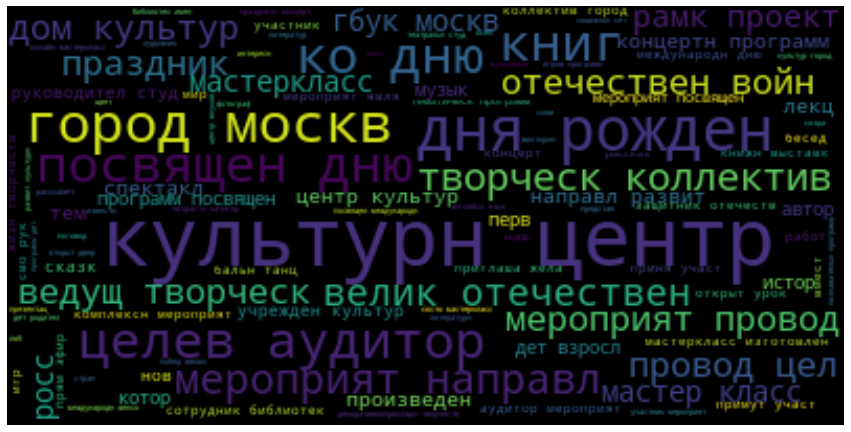

In [29]:
plt.figure(figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Предсказание, основанное на кратком описании, типе мероприятия, целевой аудитории, направленности мероприятия

In [54]:
import numpy as np
from multiprocessing import  Pool

In [51]:
features = ["Тип мероприятия", "Направленность мероприятия", "Краткое описание", "Целевая аудитория"]
extend_desc = events[features]

In [57]:
df3 = extend_desc.copy()
df3.fillna("", inplace=True)

In [58]:
for feature in features:
    df3[feature] = df3[feature].apply(lambda text: tokenize_text(text))

In [62]:
def tokenize_several_columns(data):
    df = data.copy()
    for col in df.columns:
        df[col] = df[col].apply(lambda text: tokenize_text(text))
    return df

In [69]:
train = parallelize_dataframe(df3, tokenize_several_columns, n_cores=15)

In [78]:
def create_soup(df):
    s = ""
    for feature in features:
        s += ' '.join([df[feature]]) + " "
    return s

In [79]:
df3["soup"] = train.apply(create_soup, axis=1)

In [83]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

In [84]:
# count = CountVectorizer()
# count_matrix = count.fit_transform(df3['soup'])

# cosine_sim2 = cosine_similarity(count_matrix, count_matrix)

In [120]:
tfidf2 = TfidfVectorizer()
# df2 = desc["Краткое описание"].apply(lambda text: tokenize_text(text))
tfidf_matrix2 = tfidf2.fit_transform(df3['soup'])
tfidf_matrix2.shape


(41074, 34000)

In [121]:
cosine_sim2 = linear_kernel(tfidf_matrix2, tfidf_matrix2)

In [167]:
events[70:]

,Название мероприятия,Тип мероприятия,Направленность мероприятия,Краткое описание,Округ,Район,Возрастной ценз участников мероприятия,Возрастная категория,Целевая аудитория
70,Показ мультфильмов из мульпликационного сборни...,"просмотр фильмов, мультфильмов, кинолекторий, ...",культурно-досуговое,"Все новогодние каникулы, с 2 по 6 января 2020...",Юго-Западный административный округ,Ясенево,0+,от 50 до 90,"дети дошкольного возраста, школьники, работающ..."
71,Снежные человечки в гостях у Деда Мороза,"представление, спектакль, инсценировка, перфом...",культурно-досуговое,"В сюжете произведения герои жертвуют собой, сп...",Юго-Западный административный округ,Коньково,0+,от 3 до 6,дети дошкольного возраста
72,«Рождественский домик»,"интерактивное занятие, мастер-класс, урок",культурно-досуговое,"2 января в ""Клубе ""огонёк"" состоится мастер-кл...",Северный административный округ,Ховрино,0+,от 0 до 99,"дети дошкольного возраста, школьники, работающ..."
73,Говорят. под Новый год...,"комплексное мероприятие, тематическая программа",культурно-досуговое,"02 января 2020г. в 12.00ч клубе ""Вернисаж"" по ...",Западный административный округ,Солнцево,0+,от 6 до 80,"дети дошкольного возраста, школьники"
74,"Детский мюзикл ""Буратино""","концерт, музыкальное представление",культурно-досуговое,Музыкальная история «Буратино» по мотивам пове...,Юго-Восточный административный округ,Текстильщики,0+,от 9 до 16,"дети дошкольного возраста, школьники"
...,...,...,...,...,...,...,...,...,...
41069,"""К Снегурочке на чай""","праздник, праздничная программа, утренник",культурно-досуговое,"Праздничная программа ""Волшебный маскарад"" для...",Юго-Восточный административный округ,Некрасовка,0+,от 12 до 18,"дети дошкольного возраста, школьники"
41070,Новый Год в Палитре,"праздник, праздничная программа, утренник",культурно-досуговое,"Новогоднее интерактивное,костюмированное мероп...",Западный административный округ,Крылатское,0+,от 0 до 14,"дети дошкольного возраста, школьники"
41071,Праздничный Новогодний концерт,"концерт, музыкальное представление",культурно-досуговое,"Народный театр танца ""Щелкунчик"", участие в пр...",NaN,NaN,0+,от 9 до 12,"дети дошкольного возраста, школьники, работающ..."
41072,Мультфильм своими руками.,"просмотр фильмов, мультфильмов, кинолекторий, ...",культурно-досуговое,"Приглашаем всех желающих в Культурный центр ""В...",Западный административный округ,Внуково,6+,от 6 до 12,"дети дошкольного возраста, школьники"


In [122]:
get_event_recommendations_based_on_description("Врасплох", cosine_sim=cosine_sim2)

,Название мероприятия,Тип мероприятия,Направленность мероприятия,Краткое описание,Округ,Район,Возрастной ценз участников мероприятия,Возрастная категория,Целевая аудитория
13801,Заведомо,выставка,антитеррор,Регулярное (ежеквартальное) мероприятие цикла ...,Южный административный округ,Нагатинский Затон,6+,от 3 до 10,NaN
29289,Неспроста,выставка,антитеррор,Регулярное (ежеквартальное) мероприятие цикла ...,Южный административный округ,Нагатинский Затон,6+,от 18 до 99,NaN
33433,"""Неспроста""",выставка,антитеррор,Регулярное (ежеквартальное) мероприятие цикла ...,NaN,NaN,12+,от 14 до 35,NaN
37070,"""Неспроста""",выставка,антитеррор,Регулярное (ежеквартальное) мероприятие цикла ...,NaN,NaN,12+,от 9 до 14,NaN
39275,Исподволь,выставка,антитеррор,Регулярное (ежеквартальное) мероприятие цикла ...,Южный административный округ,Нагатинский Затон,6+,от 0 до 99,NaN
27025,"""Врасплох""",выставка,антитеррор,Выставка информационно-визуальных материалов,Южный административный округ,Нагатинский Затон,12+,от 0 до 99,NaN
9000,Меры по противодействию терроризму,лекция,антитеррор,Меры по противодействию терроризму.,Северный административный округ,Ховрино,0+,от 3 до 99,"дети дошкольного возраста, школьники, работающ..."
19233,Показ видеороликов по противодействию идеологи...,"просмотр фильмов, мультфильмов, кинолекторий, ...",антитеррор,В целях противодействия идеологии терроризма и...,Северо-Восточный административный округ,Ярославский,6+,от 16 до 35,взрослые
5439,Гражданская позиция,акция,антитеррор,"Тематический показ видеороликов, посвященный п...",NaN,NaN,6+,от 18 до 99,"дети дошкольного возраста, школьники, работающ..."
33434,"""Бережно""",выставка,просветительское,Выставка информационных материалов для посетит...,NaN,NaN,12+,от 14 до 35,NaN


In [123]:
get_event_recommendations_based_on_description('Выставка к Рождеству "Сувенир Года"')

,Название мероприятия,Тип мероприятия,Направленность мероприятия,Краткое описание,Округ,Район,Возрастной ценз участников мероприятия,Возрастная категория,Целевая аудитория
903,Праздник Рождества,"представление, спектакль, инсценировка, перфом...",культурно-досуговое,"Комплексное мероприятие, посвященное празднику...",Северо-Восточный административный округ,Северное Медведково,0+,от 0 до 90,"дети дошкольного возраста, школьники, работающ..."
40037,"Выставка творческих работ, посвященная встрече...",выставка,культурно-досуговое,14 декабря в преддверии Нового года и Рождеств...,Юго-Восточный административный округ,Выхино-Жулебино,0+,от 0 до 99,"дети дошкольного возраста, школьники, работающ..."
4637,"Концерт ""Музыкальный вкус""","концерт, музыкальное представление",культурно-досуговое,"Концерт ""Музыкальный вкус"" в 19:00. Борисовски...",Южный административный округ,Орехово-Борисово Северное,12+,от 0 до 6,"школьники, работающая молодежь, студенческая м..."
40035,Новогодний калейдоскоп,выставка,культурно-досуговое,"Новый год – долгожданный праздник, особенно дл...",Северо-Западный административный округ,Щукино,0+,от 2 до 90,"дети дошкольного возраста, школьники, студенче..."
647,Рождество и русская литература,"комплексное мероприятие, тематическая программа",просветительское,Программа посвящена Рождеству Христово,Восточный административный округ,Гольяново,12+,от 12 до 90,"школьники, работающая молодежь, студенческая м..."
40626,С Рождеством Христовым!,выставка,культурно-досуговое,Выставка детских творческих работ на кануне пр...,Северо-Западный административный округ,Хорошёво-Мнёвники,0+,от 0 до 55,"дети дошкольного возраста, школьники, работающ..."
709,Рождественские посиделки,"комплексное мероприятие, тематическая программа",культурно-досуговое,Мероприятие посвящено Рождеству Христово,Восточный административный округ,Сокольники,6+,от 6 до 75,"дети дошкольного возраста, школьники, работающ..."
7763,Юный художник,выставка,просветительское,"Выставка работ воспитанников изостудии ""Юный х...",NaN,NaN,0+,от 3 до 99,"дети дошкольного возраста, школьники, работающ..."
39488,Юный художник,выставка,просветительское,"Выставка работ воспитанников изостудии ""Юный х...",NaN,NaN,0+,от 3 до 99,"дети дошкольного возраста, школьники, работающ..."
5068,Мастер-класс по каратэ,"игра, игровая программа","спортивное, пропаганда здорового образа жизни",Мастер-класс по каратэ в 16:00. Борисовский пр...,Южный административный округ,Орехово-Борисово Северное,12+,от 6 до 11,школьники


## Clustering based on the TFIDF

In [21]:
from sklearn.cluster import KMeans

In [137]:
km = KMeans(n_clusters=5, max_iter=200, n_init=10)
km = km.fit(tfidf_matrix2)

In [144]:
events_with_clusters = events.copy()
events_with_clusters["cluster"] = km.labels_

In [146]:
collections.Counter(km.labels_)

Counter({0: 23115, 1: 6902, 4: 5117, 3: 4341, 2: 1599})

In [149]:
events_with_clusters["clean_description"] = df2

Cluster 0


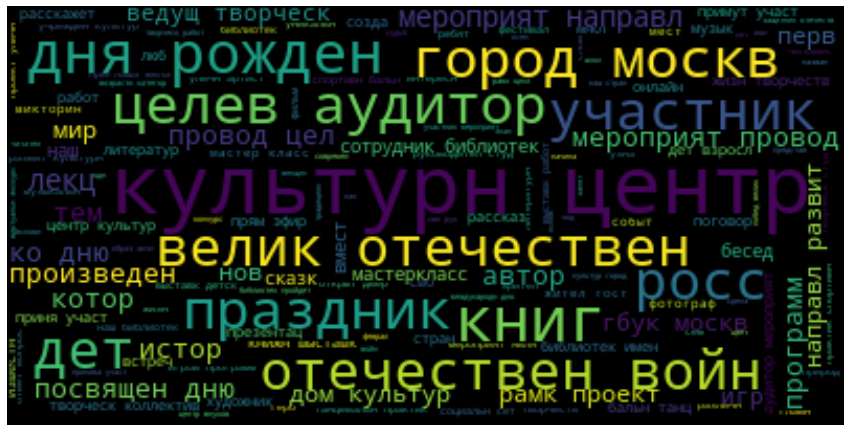

Cluster 1


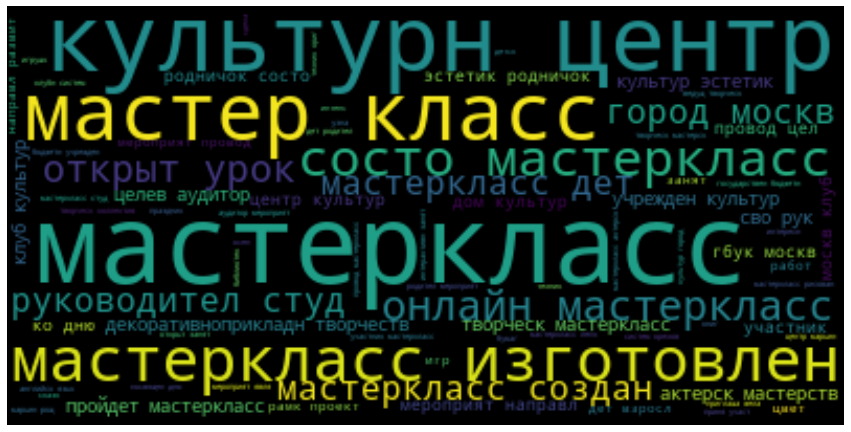

Cluster 2


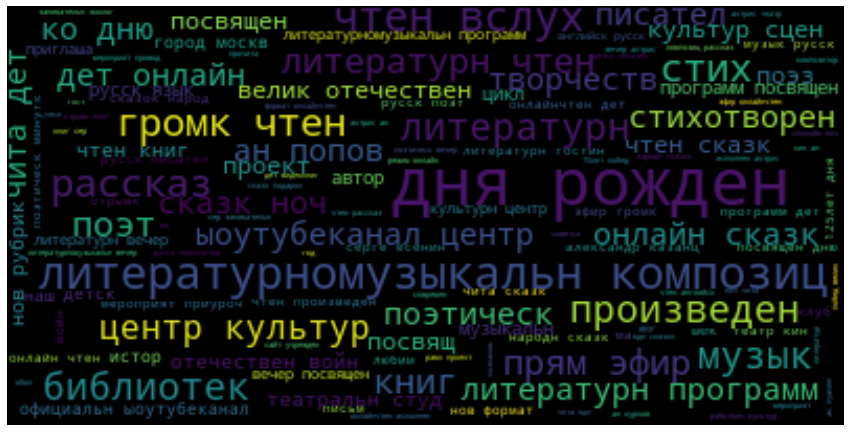

Cluster 3


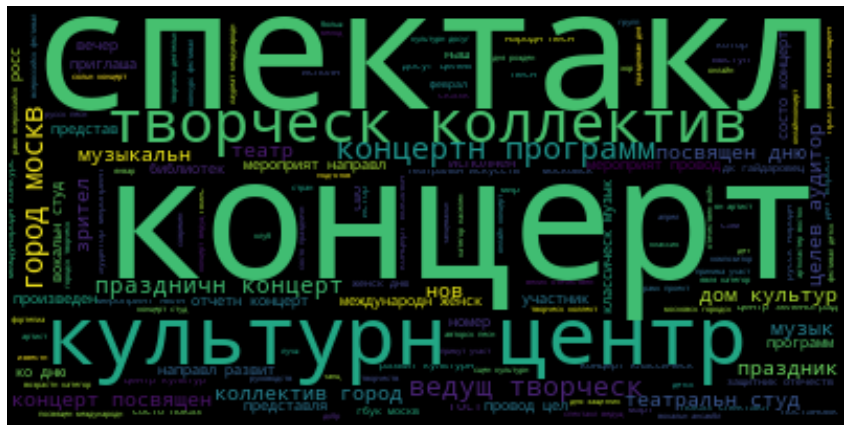

Cluster 4


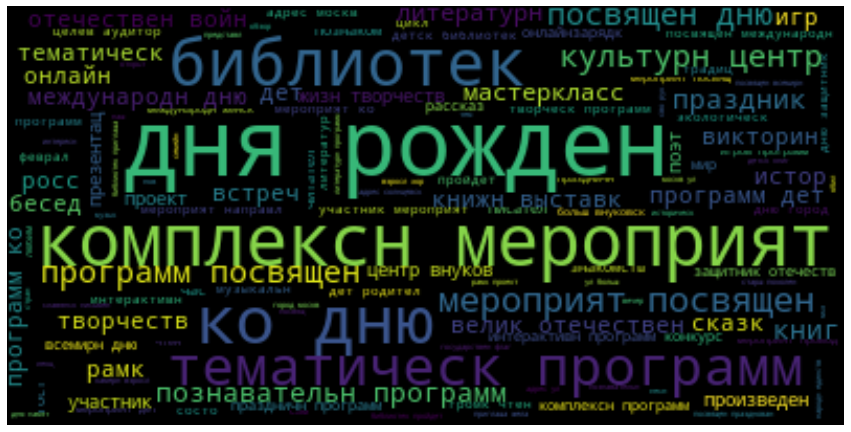

In [160]:
for group, df in events_with_clusters[["clean_description", "cluster"]].groupby("cluster"):
    print(f"Cluster {group}")
#     print(df["clean_description"].values)
    wordcloud = WordCloud().generate(" ".join((df["clean_description"].values)))
    plt.figure(figsize=(15,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
#     break
          

## Кластеризация описаний мероприятий

In [104]:
def compose_embedd_vector(words, age):
    """
    Example:
    
    > words = np.array([[1, 2, 3], [-1, 0, 13], [0, 2, -3]])
    > array([[ 1,  2,  3],
             [-1,  0, 13],
             [ 0,  2, -3]])
           
    > age = np.array([1, 1, 1, 0, 0])
    > array([1, 1, 1, 0, 0])
    
    > compose_embedd_vector(words, age)
    > array([-1,  0, -3,  1,  2, 13,  1,  1,  1,  0,  0])
    """
    min_vec = words.min(axis=0)
    max_vec = words.max(axis=0)
    return np.concatenate((min_vec, max_vec, age))

In [18]:
# compose_embedd_vector(words, age)

In [19]:
selected_features = ["Краткое описание", "Возрастной ценз участников мероприятия"]
cluster_embedd_data = events[selected_features]
cluster_embedd_data.head()

,Краткое описание,Возрастной ценз участников мероприятия
0,Клуб Современник проведет фестиваль современны...,0+
1,"Танцевальный вечер ""Ретро"" в честь Дня Победы",16+
2,Регулярное (ежеквартальное) мероприятие цикла ...,6+
3,Коллектив Культурного центра ЗИЛ Ансамбль эстр...,0+
4,В преддверии волшебного праздника Рождества Хр...,6+


### 1. Предобработка текстовых данных

In [58]:
import wget

udpipe_url = 'https://rusvectores.org/static/models/udpipe_syntagrus.model'
text_url = 'https://rusvectores.org/static/henry_sobolya.txt'

modelfile = wget.download(udpipe_url)
textfile = wget.download(text_url)

In [59]:
def clean_token(token, misc):
    out_token = token.strip().replace(' ', '')
    if token == 'Файл' and 'SpaceAfter=No' in misc:
        return None
    return out_token


def clean_lemma(lemma, pos):
    out_lemma = lemma.strip().replace(' ', '').replace('_', '').lower()
    if '|' in out_lemma or out_lemma.endswith('.jpg') or out_lemma.endswith('.png'):
        return None
    if pos != 'PUNCT':
        if out_lemma.startswith('«') or out_lemma.startswith('»'):
            out_lemma = ''.join(out_lemma[1:])
        if out_lemma.endswith('«') or out_lemma.endswith('»'):
            out_lemma = ''.join(out_lemma[:-1])
        if out_lemma.endswith('!') or out_lemma.endswith('?') or out_lemma.endswith(',') \
                or out_lemma.endswith('.'):
            out_lemma = ''.join(out_lemma[:-1])
    return out_lemma

In [60]:
def process(pipeline, text='Строка', keep_pos=True, keep_punct=False):
    entities = {'PROPN'}
    named = False
    memory = []
    mem_case = None
    mem_number = None
    tagged_propn = []

    # обрабатываем текст, получаем результат в формате conllu:
    processed = pipeline.process(text)

    # пропускаем строки со служебной информацией:
    content = [l for l in processed.split('\n') if not l.startswith('#')]

    # извлекаем из обработанного текста леммы, тэги и морфологические характеристики
    tagged = [w.split('\t') for w in content if w]

    for t in tagged:
        if len(t) != 10:
            continue
        (word_id, token, lemma, pos, xpos, feats, head, deprel, deps, misc) = t
        token = clean_token(token, misc)
        lemma = clean_lemma(lemma, pos)
        if not lemma or not token:
            continue
        if pos in entities:
            if '|' not in feats:
                tagged_propn.append('%s_%s' % (lemma, pos))
                continue
            morph = {el.split('=')[0]: el.split('=')[1] for el in feats.split('|')}
            if 'Case' not in morph or 'Number' not in morph:
                tagged_propn.append('%s_%s' % (lemma, pos))
                continue
            if not named:
                named = True
                mem_case = morph['Case']
                mem_number = morph['Number']
            if morph['Case'] == mem_case and morph['Number'] == mem_number:
                memory.append(lemma)
                if 'SpacesAfter=\\n' in misc or 'SpacesAfter=\s\\n' in misc:
                    named = False
                    past_lemma = '::'.join(memory)
                    memory = []
                    tagged_propn.append(past_lemma + '_PROPN ')
            else:
                named = False
                past_lemma = '::'.join(memory)
                memory = []
                tagged_propn.append(past_lemma + '_PROPN ')
                tagged_propn.append('%s_%s' % (lemma, pos))
        else:
            if not named:
                if pos == 'NUM' and token.isdigit():  # Заменяем числа на xxxxx той же длины
                    lemma = num_replace(token)
                tagged_propn.append('%s_%s' % (lemma, pos))
            else:
                named = False
                past_lemma = '::'.join(memory)
                memory = []
                tagged_propn.append(past_lemma + '_PROPN ')
                tagged_propn.append('%s_%s' % (lemma, pos))

    if not keep_punct:
        tagged_propn = [word for word in tagged_propn if word.split('_')[1] != 'PUNCT']
    if not keep_pos:
        tagged_propn = [word.split('_')[0] for word in tagged_propn]
    return tagged_propn


In [61]:
from ufal.udpipe import Model, Pipeline
import os
import re
import sys

def tag_ud(text='Текст нужно передать функции в виде строки!', modelfile='udpipe_syntagrus.model'):
    udpipe_model_url = 'https://rusvectores.org/static/models/udpipe_syntagrus.model'
    udpipe_filename = udpipe_model_url.split('/')[-1]

    if not os.path.isfile(modelfile):
        print('UDPipe model not found. Downloading...', file=sys.stderr)
        wget.download(udpipe_model_url)

    print('\nLoading the model...', file=sys.stderr)
    model = Model.load(modelfile)
    process_pipeline = Pipeline(model, 'tokenize', Pipeline.DEFAULT, Pipeline.DEFAULT, 'conllu')

    print('Processing input...', file=sys.stderr)
    for line in text:
        # line = unify_sym(line.strip()) # здесь могла бы быть ваша функция очистки текста
        output = process(process_pipeline, text=line)
        print(' '.join(output))

In [62]:
from pymystem3 import Mystem

def tag_mystem(text='Текст нужно передать функции в виде строки!'):  
    m = Mystem()
    processed = m.analyze(text)
    tagged = []
    for w in processed:
        try:
            lemma = w["analysis"][0]["lex"].lower().strip()
            pos = w["analysis"][0]["gr"].split(',')[0]
            pos = pos.split('=')[0].strip()
            tagged.append(lemma.lower() + '_' + pos)
        except KeyError:
            continue # я здесь пропускаю знаки препинания, но вы можете поступить по-другому
    return tagged

In [63]:
import requests
import re

url = 'https://raw.githubusercontent.com/akutuzov/universal-pos-tags/4653e8a9154e93fe2f417c7fdb7a357b7d6ce333/ru-rnc.map'

mapping = {}
r = requests.get(url, stream=True)
for pair in r.text.split('\n'):
    pair = re.sub('\s+', ' ', pair, flags=re.U).split(' ')
    if len(pair) > 1:
        mapping[pair[0]] = pair[1]

In [64]:
def tag_mystem(text='Текст нужно передать функции в виде строки!'):  
    m = Mystem()
    processed = m.analyze(text)
    tagged = []
    for w in processed:
        try:
            if w["analysis"]:
                lemma = w["analysis"][0]["lex"].lower().strip()
                pos = w["analysis"][0]["gr"].split(',')[0]
                pos = pos.split('=')[0].strip()
    #             print(lemma)
                if lemma not in set(russian_stop_words["words"]):
                    if pos in mapping:
                        tagged.append(lemma + '_' + mapping[pos]) # здесь мы конвертируем тэги
                    else:
                        tagged.append(lemma + '_X') # на случай, если попадется тэг, которого нет в маппинге
            else:
                continue
        except KeyError:
            continue # я здесь пропускаю знаки препинания, но вы можете поступить по-другому
    return tagged

In [65]:
tag_mystem(text='"Зимняя сказка" - это в на презентация творчества участников разных арт-студий Культурного центра "Зодчие". ')

['зимний_ADJ',
 'сказка_NOUN',
 'презентация_NOUN',
 'творчество_NOUN',
 'участник_NOUN',
 'разный_ADJ',
 'арт_NOUN',
 'студия_NOUN',
 'культурный_ADJ',
 'центр_NOUN',
 'зодчий_NOUN']

In [251]:
cluster_embedd_data["Краткое описание"][4]

'В преддверии волшебного праздника Рождества Христова в структурном подразделении Клубной системы "Орехово" Районном культурно-досуговом центре "Созвездие" с 1 января состоится выставка творческих работ воспитанников изостудий учреждения. По адресу: Борисовский проезд, д. 22, к. 1, стр. 2 всем желающим можно будет записаться в студию.'

In [56]:
def match_age_cat(text):
    if text == "0+":
        return [1, 1, 1, 1, 1]
    elif text == "6+":
        return [0, 1, 1, 1, 1]
    
    elif text == "12+":
        return [0, 0, 1, 1, 1]
    
    elif text == "16+":
        return [0, 0, 0, 1, 1]
    else:
        return [0, 0, 0, 0, 1]

In [274]:
match_age_cat("16+")

[0, 0, 0, 1, 1]

In [275]:
def build_embedd(data):
    df = data.copy()
    df["description_embedd"] = df["Краткое описание"].apply(lambda t: tag_mystem(text=t))
    df["age_embedd"] = df["Возрастной ценз участников мероприятия"].apply(lambda t: match_age_cat(text=t))
    return df

In [276]:
build_embedd(cluster_embedd_data[:4])

,Краткое описание,Возрастной ценз участников мероприятия,description_embedd,age_embedd
0,Клуб Современник проведет фестиваль современны...,0+,"[клуб_NOUN, современник_NOUN, проводить_VERB, ...","[1, 1, 1, 1, 1]"
1,"Танцевальный вечер ""Ретро"" в честь Дня Победы",16+,"[танцевальный_ADJ, вечер_NOUN, ретро_NOUN, чес...","[0, 0, 0, 1, 1]"
2,Регулярное (ежеквартальное) мероприятие цикла ...,6+,"[регулярный_ADJ, ежеквартальный_ADJ, мероприят...","[0, 1, 1, 1, 1]"
3,Коллектив Культурного центра ЗИЛ Ансамбль эстр...,0+,"[коллектив_NOUN, культурный_ADJ, центр_NOUN, з...","[1, 1, 1, 1, 1]"


In [268]:
collections.Counter(cluster_embedd_data["Возрастной ценз участников мероприятия"])

Counter({'0+': 11226,
         '16+': 4280,
         '6+': 15007,
         '18+': 3745,
         '12+': 6815,
         nan: 1})

In [269]:
cluster_embedd_data.isna().sum()

Краткое описание                          0
Возрастной ценз участников мероприятия    1
dtype: int64

In [271]:
cluster_embedd_data.fillna(method="ffill").isna().sum()

Краткое описание                          0
Возрастной ценз участников мероприятия    0
dtype: int64

In [278]:
# долго :-( 

# train_cluster_embedd_data = parallelize_dataframe(
#     cluster_embedd_data.fillna(method="ffill"), build_embedd, n_cores=15
# )
# train_cluster_embedd_data.head()

In [284]:
# def calc_distortion(num_clusters):
#     kmeanModel = KMeans(n_clusters=num_clusters)
#     kmeanModel.fit(tfidf_matrix)
#     return kmeanModel.inertia_

In [285]:
# with Pool(processes=15) as P:
#     print(P.map(calc_distortion, [2, 3]))

In [23]:
km_describtion = KMeans(n_clusters=20, max_iter=200, n_init=10)
km_describtion = km_describtion.fit(tfidf_matrix)

In [24]:
km_describtion.labels_

array([ 9, 17,  2, ...,  2, 10,  2], dtype=int32)

In [28]:
cluster_embedd_data.loc[:, "cluster"] = km_describtion.labels_

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [31]:
cluster_embedd_data.head()

,Краткое описание,Возрастной ценз участников мероприятия,cluster
0,Клуб Современник проведет фестиваль современны...,0+,9
1,"Танцевальный вечер ""Ретро"" в честь Дня Победы",16+,17
2,Регулярное (ежеквартальное) мероприятие цикла ...,6+,2
3,Коллектив Культурного центра ЗИЛ Ансамбль эстр...,0+,2
4,В преддверии волшебного праздника Рождества Хр...,6+,11


In [35]:
clustered_text = cluster_embedd_data.groupby("cluster")["Краткое описание"].transform(lambda x: ','.join(x)).drop_duplicates()

In [37]:
clustered_age = (
    cluster_embedd_data.fillna(method="ffill")
    .groupby("cluster")["Возрастной ценз участников мероприятия"]
    .transform(lambda x: ",".join(x))
    .drop_duplicates()
)

In [42]:
clustered_data = pd.DataFrame(clustered_age)
clustered_data["Краткое описание"] = clustered_text

In [43]:
clustered_data

,Возрастной ценз участников мероприятия,Краткое описание
0,"0+,0+,0+,6+,0+,0+,0+,0+,0+,0+,18+,0+,0+,0+,0+,...",Клуб Современник проведет фестиваль современны...
1,"16+,18+,18+,12+,12+,12+,18+,18+,12+,18+,12+,16...","Танцевальный вечер ""Ретро"" в честь Дня Победы,..."
2,"6+,0+,6+,0+,0+,0+,0+,0+,0+,0+,0+,0+,0+,0+,0+,0...",Регулярное (ежеквартальное) мероприятие цикла ...
4,"6+,6+,0+,0+,0+,0+,0+,0+,6+,6+,18+,0+,0+,18+,0+...",В преддверии волшебного праздника Рождества Хр...
5,"0+,0+,0+,6+,6+,0+,6+,6+,12+,0+,0+,6+,6+,6+,0+,...","""Зимняя сказка"" - это презентация творчества у..."
6,"0+,0+,6+,6+,0+,0+,6+,0+,6+,0+,0+,6+,0+,6+,6+,6...",В Новый год все верят в чудеса. Дети и взрослы...
28,"0+,0+,0+,0+,6+,6+,6+,6+,6+,6+,6+,6+,0+,12+,12+...",Соревнования – неотъемлемая часть занятий спор...
29,"18+,18+,18+,18+,18+,18+,18+,18+,18+,18+,18+,18...",Танцевальная практика по спортивным бальным та...
46,"0+,0+,6+,0+,0+,12+,0+,18+,0+,6+,0+,0+,0+,0+,6+...","Праздничная Новогодняя программа,02 января 202..."
66,"0+,18+,12+,0+,6+,6+,0+,12+,6+,6+,12+,0+,6+,0+,...","Новогоднее квест-шоу ""Хвост за хвост"" Театра ""..."


In [71]:
clustered_data[:5]

,Возрастной ценз участников мероприятия,Краткое описание
0,"0+,0+,0+,6+,0+,0+,0+,0+,0+,0+,18+,0+,0+,0+,0+,...",Клуб Современник проведет фестиваль современны...
1,"16+,18+,18+,12+,12+,12+,18+,18+,12+,18+,12+,16...","Танцевальный вечер ""Ретро"" в честь Дня Победы,..."
2,"6+,0+,6+,0+,0+,0+,0+,0+,0+,0+,0+,0+,0+,0+,0+,0...",Регулярное (ежеквартальное) мероприятие цикла ...
4,"6+,6+,0+,0+,0+,0+,0+,0+,6+,6+,18+,0+,0+,18+,0+...",В преддверии волшебного праздника Рождества Хр...
5,"0+,0+,0+,6+,6+,0+,6+,6+,12+,0+,0+,6+,6+,6+,0+,...","""Зимняя сказка"" - это презентация творчества у..."


In [140]:
def preprocess_text(text):
    words = text.split()
    # remove punctuation from each word
    table = str.maketrans('', '', string.punctuation)
    stripped = [w.translate(table).lower() for w in words]
    removed = [word for word in stripped if word not in set(russian_stop_words["words"])]
    return " ".join(set(removed))

In [144]:
clustered_data["clean_descr"] = clustered_data["Краткое описание"].apply(lambda x: preprocess_text(x))

In [145]:
clustered_data.head(3)

,Возрастной ценз участников мероприятия,Краткое описание,clean_descr
0,"0+,0+,0+,6+,0+,0+,0+,0+,0+,0+,18+,0+,0+,0+,0+,...",Клуб Современник проведет фестиваль современны...,знаний команда вашего вместеруководитель испо...
1,"16+,18+,18+,12+,12+,12+,18+,18+,12+,18+,12+,16...","Танцевальный вечер ""Ретро"" в честь Дня Победы,...",стихотворение симонова краевед церемонию судь...
2,"6+,0+,6+,0+,0+,0+,0+,0+,0+,0+,0+,0+,0+,0+,0+,0...",Регулярное (ежеквартальное) мероприятие цикла ...,туманный доброты» производством священным рос...


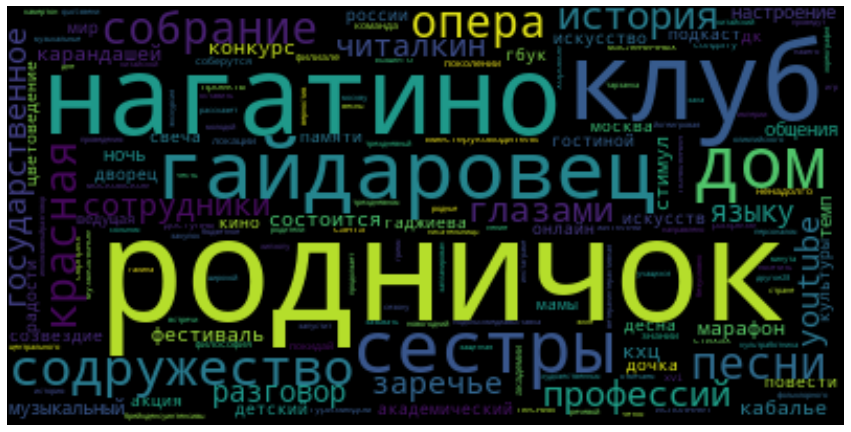

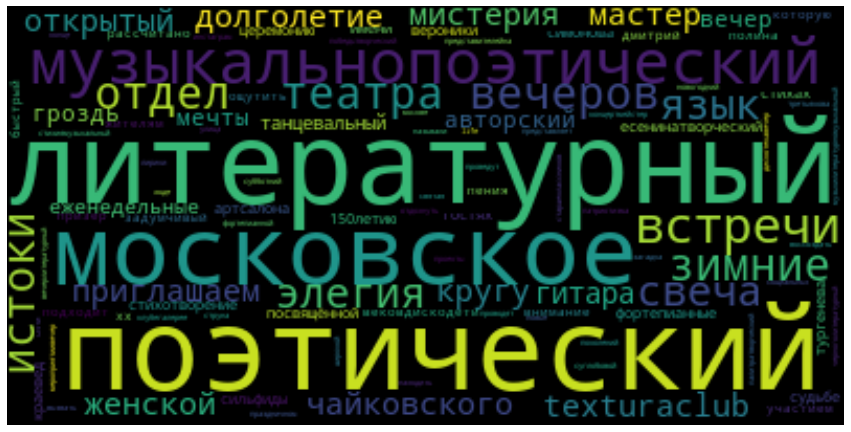

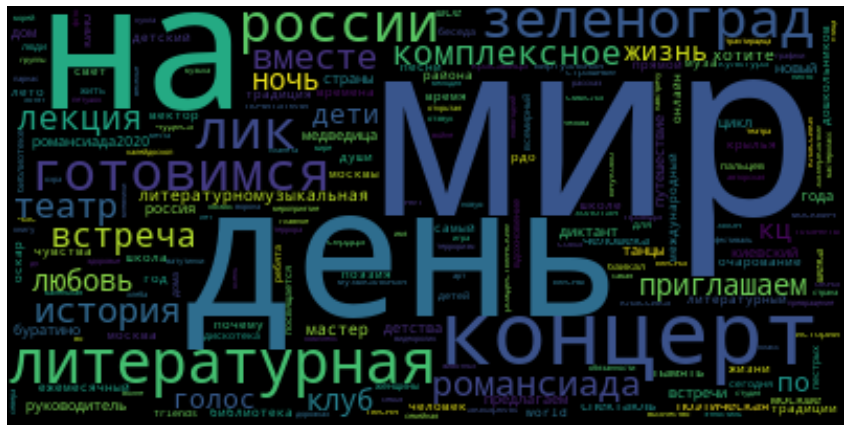

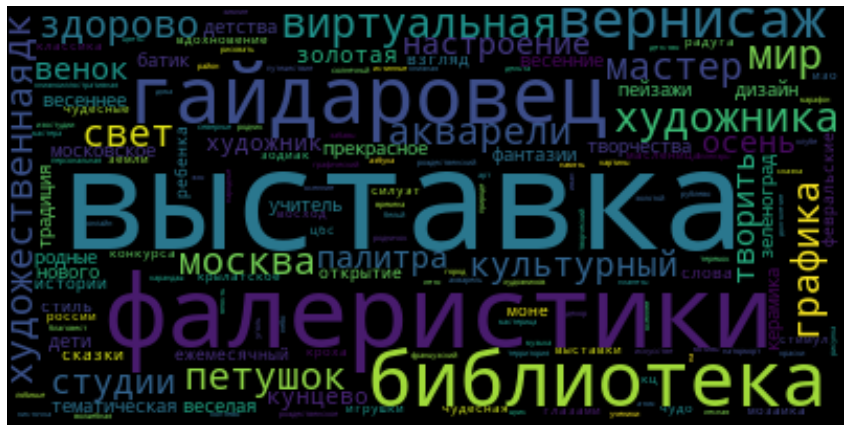

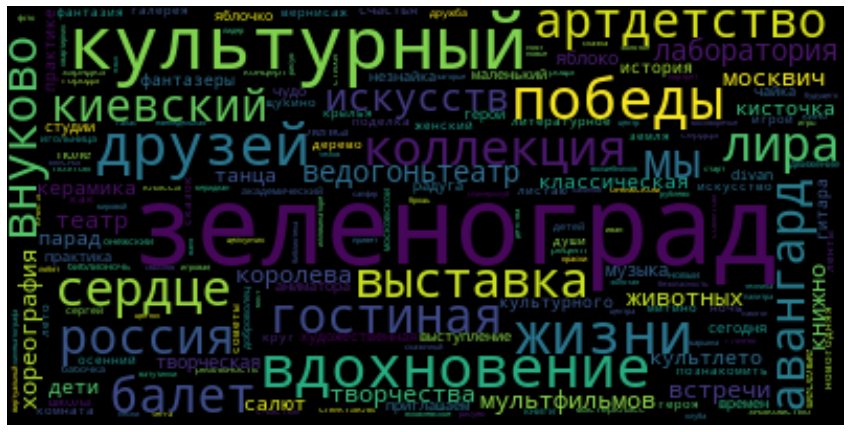

...

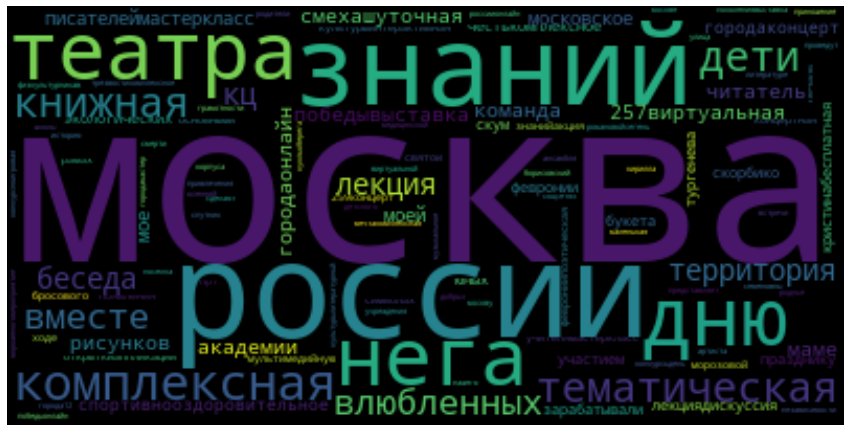

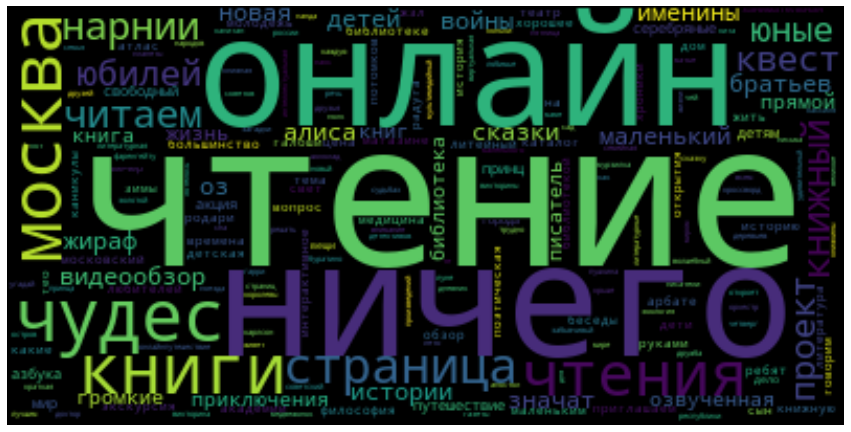

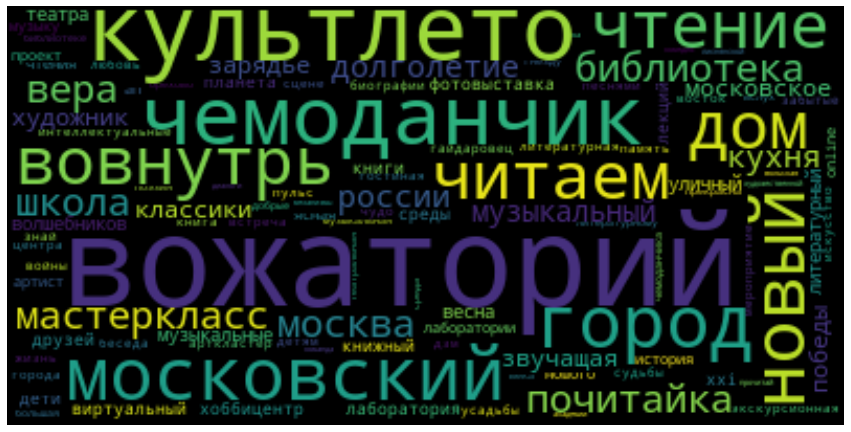

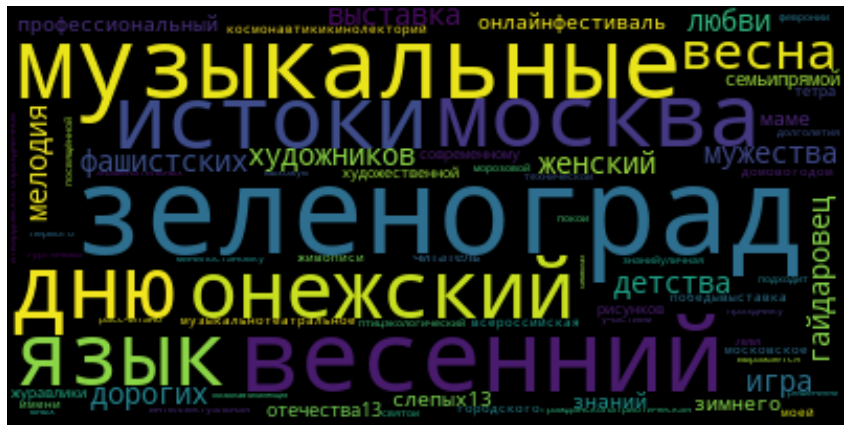

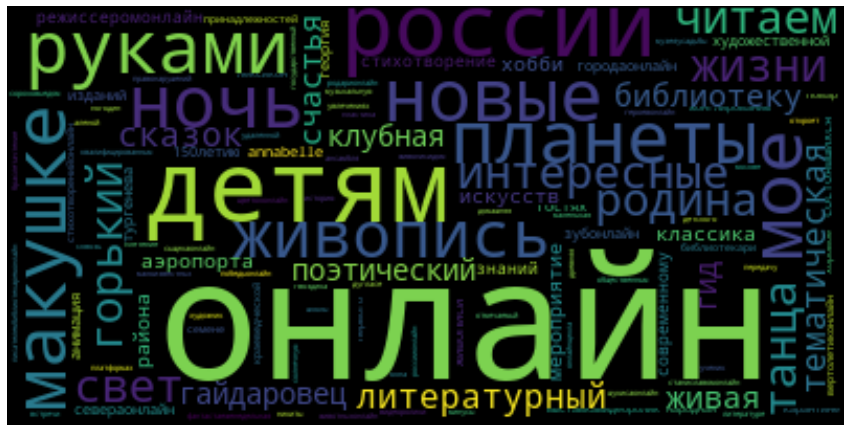

In [156]:
for df in clustered_data["clean_descr"].values:
    wordcloud = WordCloud().generate(df)
    plt.figure(figsize=(15,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
#     break
          

In [146]:
def map_ages_weighted(d):
    val = 0
    for key in d:
        val += d[key] * np.array(match_age_cat(key))
    return val / sum(d.values())

In [147]:
def build_embedd_on_cluster(data, model):
    df = data.copy()
    df["description_embedd"] = (
        df["clean_descr"]
        .apply(lambda t: tag_mystem(text=t))
        .map(lambda words: model[[w for w in words if w in model]])
    )#.map(lambda r: compose_embedd_vector(r["description_embedd"], r["age_embedd"]))
    df["age_embedd"] = (
        df["Возрастной ценз участников мероприятия"]
        .apply(lambda x: collections.Counter(x.split(",")))
        .apply(lambda d: map_ages_weighted(d))
    )
    return df[["description_embedd", "age_embedd"]]

In [148]:
train_cluster_embedd_data = build_embedd_on_cluster(clustered_data.fillna(method="ffill"), model)

In [149]:
train_cluster_embedd_data.head(3)

,description_embedd,age_embedd
0,"[[0.9374245, -2.243582, 2.6592047, -1.0919474,...","[0.34446130500758726, 0.7617602427921093, 0.85..."
1,"[[1.049166, -3.6171656, -1.7553273, -3.8446193...","[0.09710743801652892, 0.2396694214876033, 0.50..."
2,"[[1.1059937, -1.8950852, 1.1482688, -0.0007963...","[0.23492029297716502, 0.573675140025851, 0.767..."


In [158]:
cluster_embedding = {i: train_cluster_embedd_data.apply(
    lambda x: compose_embedd_vector(x["description_embedd"], x["age_embedd"]), axis=1
).values[i] for i in range(20)}

In [160]:
cluster_embedding.values()

dict_values([array([-5.77130604, -4.9482193 , -4.85565329, -5.10117054, -4.6760416 ,
       -6.74775219, -5.44043779, -5.08024549, -5.93478298, -5.80639696,
       -5.16883135, -6.53773355, -4.30679655, -6.13552856, -5.38927364,
       -5.55858421, -4.24377584, -5.77838326, -5.95964003, -4.93126011,
       -4.61995792, -5.61224318, -6.31736469, -6.49701452, -4.35681057,
       -6.56077909, -5.9011178 , -5.56929588, -4.36193657, -4.8553915 ,
       -5.19412756, -5.56925154, -5.79464436, -4.88415575, -5.94834328,
       -6.39748526, -6.8350563 , -6.05338717, -4.53751564, -5.76705933,
       -5.49716568, -6.00046301, -5.82681847, -6.66207457, -5.29510212,
       -5.92280436, -5.08722878, -5.37793636, -5.5996356 , -5.83027697,
       -5.47025061, -6.42440462, -4.25860834, -5.0001297 , -4.84481525,
       -7.15539074, -6.55656385, -5.88953447, -6.05204582, -5.02351761,
       -4.99763298, -5.30611563, -7.64852571, -7.68388557, -5.39599657,
       -5.92540932, -5.88525343, -5.24753475, -4.46

In [168]:
import umap

In [ ]:
umap.U

In [165]:
reducer = umap.

TypeError: 'module' object is not callable

### Работа с моделью

In [79]:
import zipfile
import sys
import gensim
model_url = 'http://vectors.nlpl.eu/repository/11/180.zip'
m = wget.download(model_url)
model_file = model_url.split('/')[-1]
with zipfile.ZipFile(model_file, 'r') as archive:
    stream = archive.open('model.bin')
    model = gensim.models.KeyedVectors.load_word2vec_format(stream, binary=True)

In [128]:
train_cluster_embedd_data

,description_embedd,age_embedd
0,"[[-3.5264854, -1.3206306, 0.9307467, 0.1745062...","[0.34446130500758726, 0.7617602427921093, 0.85..."


In [125]:
d_in, age_in = train_cluster_embedd_data1[["description_embedd", "age_embedd"]].values[0]
compose_embedd_vector(d_in, age_in)

array([-5.77130604, -4.9482193 , -4.85565329, -5.10117054, -5.27861881,
       -6.74775219, -5.44043779, -5.08024549, -5.93478298, -5.80639696,
       -5.16883135, -6.53773355, -4.30679655, -6.13552856, -5.38927364,
       -5.55858421, -4.24377584, -5.77838326, -5.95964003, -4.93126011,
       -4.61995792, -5.61224318, -6.31736469, -6.49701452, -4.35681057,
       -6.56077909, -5.9011178 , -5.56929588, -4.36193657, -4.8553915 ,
       -5.19412756, -5.56925154, -5.79464436, -4.88415575, -5.94834328,
       -6.39748526, -6.8350563 , -6.05338717, -4.53751564, -5.76705933,
       -5.49716568, -6.00046301, -5.82681847, -6.66207457, -5.29510212,
       -5.92280436, -5.08722878, -5.37793636, -5.5996356 , -5.83027697,
       -5.47025061, -6.42440462, -4.68902683, -5.0001297 , -4.84481525,
       -7.15539074, -6.55656385, -5.88953447, -6.05204582, -5.02351761,
       -4.99763298, -5.30611563, -7.64852571, -7.68388557, -5.39599657,
       -5.92540932, -5.88525343, -5.41734695, -4.46670151, -4.93

In [120]:
# compose_embedd_vector(words=train_cluster_embedd_data1["description_embedd"].values, age=train_cluster_embedd_data1["age_embedd"] )

In [ ]:
# parallelize_dataframe(
#     clustered_data[:5].fillna(method="ffill"), build_embedd_on_cluster, n_cores=15
# )

In [ ]:
# train_cluster_embedd_data = parallelize_dataframe(
#     clustered_data.fillna(method="ffill"), build_embedd_on_cluster, n_cores=15
# )
# train_cluster_embedd_data.head()